In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities
from correlations import correlation_industry_pairs, correlation_network_degree,correlation_adjacency_matrix
import seaborn as sns

# Comparison between Flows and Connection algorithms for 2014-2018 matrices 

## Flows


In [2]:
label1 = "Table3_Reduced_matrix_2014_2018_flows"
reduced_matrix_2014_2018 = pd.read_csv("../data/"+label1+".csv", index_col=0)

reduced_matrix_2014_2018_flows = reduced_matrix_2014_2018[reduced_matrix_2014_2018['StartIndst']!=0]

sub_matrix_2014_2018_less1 = reduced_matrix_2014_2018_flows[reduced_matrix_2014_2018_flows['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2014_2018_flows = sub_matrix_2014_2018_less1[sub_matrix_2014_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2014_2018_flows.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018_flows['StartIndst'].values,sub_matrix_2014_2018_flows['FinalIndst'].values])))
sub_matrix_2014_2018_flows[1:15]

Number of links: 555.0
Number of 4-digit industries observed:
220


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
1976,2399,2363,0.999586,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
2030,4636,1082,0.999552,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2166,3317,4212,0.999500,Transport equipment nec,"Railways, underground railways",Repair/installation excl. household,Civil engineering,Machinery repair excluding motor vehicles,Construction (including development of real es...,16.0
2149,147,1091,0.999500,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2083,1091,147,0.999483,Prepared farm animals feeds,Raising of poultry,Food products - other,"Animal production, hunting","Manufacture food, drink, tobacco","Agriculture, Forestry, Fishing, Veterinary",11.0
2167,1089,1084,0.999449,Other food products nec,Condiments and seasonings,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",11.0
2145,1084,1089,0.999294,Condiments and seasonings,Other food products nec,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0
2162,1082,4636,0.999294,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2025,811,2351,0.999225,"Ornamental, building stone etc",Cement,"Mining, Quarrying and other",Other non-metallic mineral products,"Mining, Quarrying (inc extraction of petroleum...",All other Manufacturing,10.0
2161,2363,2399,0.999173,Ready-mixed concrete,Non-metallic mineral nec,"Concrete, cement and plaster",Other non-metallic mineral products,All other Manufacturing,All other Manufacturing,34.0


## Connections


In [3]:
label2 = "Table4_Reduced_matrix_2014_2018_connections"
reduced_matrix_2014_2018_conn = pd.read_csv("../data/"+label2+".csv", index_col=0)

reduced_matrix_2014_2018_conn = reduced_matrix_2014_2018_conn[reduced_matrix_2014_2018_conn['StartIndst']!=0]


sub_matrix_2014_2018_conn_less1 = reduced_matrix_2014_2018_conn[reduced_matrix_2014_2018_conn['weight']<1]
sub_matrix_2014_2018_conn = sub_matrix_2014_2018_conn_less1[sub_matrix_2014_2018_conn_less1['weight']>0]

print ("Number of links:", sub_matrix_2014_2018_conn.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018_conn['StartIndst'].values,sub_matrix_2014_2018_conn['FinalIndst'].values])))

sub_matrix_2014_2018_conn.sort_values(by=['weight'], ascending=False)[1:15]



Number of links: 702.0
Number of 4-digit industries observed:
230


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2458,147,1091,0.999598,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2474,1082,4636,0.999488,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2350,4636,1082,0.999488,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2269,2399,2363,0.999398,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
2473,2363,2399,0.999398,Ready-mixed concrete,Non-metallic mineral nec,"Concrete, cement and plaster",Other non-metallic mineral products,All other Manufacturing,All other Manufacturing,35.0
2454,1084,1089,0.999357,Condiments and seasonings,Other food products nec,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0
2479,1089,1084,0.999357,Other food products nec,Condiments and seasonings,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",11.0
2304,3103,3109,0.999277,Mattresses,Other,Furniture,Furniture,All other Manufacturing,All other Manufacturing,10.0
2481,3109,3103,0.999277,Other,Mattresses,Furniture,Furniture,All other Manufacturing,All other Manufacturing,10.0
2243,2351,811,0.999267,Cement,"Ornamental, building stone etc",Other non-metallic mineral products,"Mining, Quarrying and other",All other Manufacturing,"Mining, Quarrying (inc extraction of petroleum...",25.0


/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


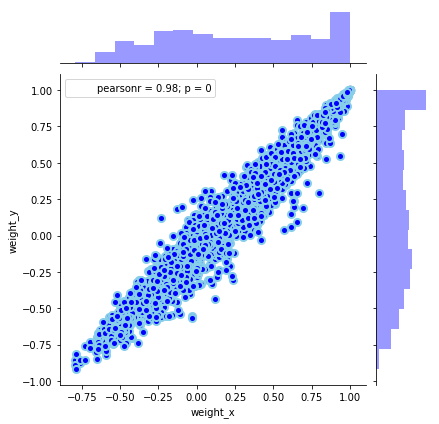

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


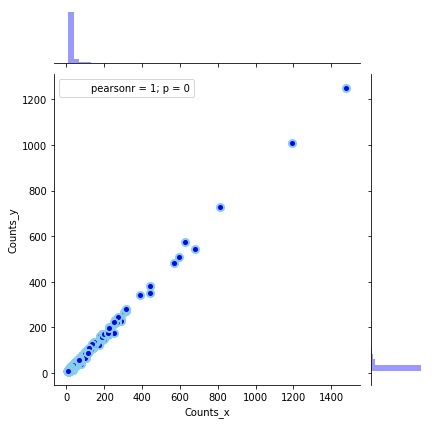

In [4]:
correlation_industry_pairs(sub_matrix_2014_2018_conn_less1,sub_matrix_2014_2018_less1)


correlation_industry_pairs(sub_matrix_2014_2018_conn_less1,sub_matrix_2014_2018_less1,'counts')


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


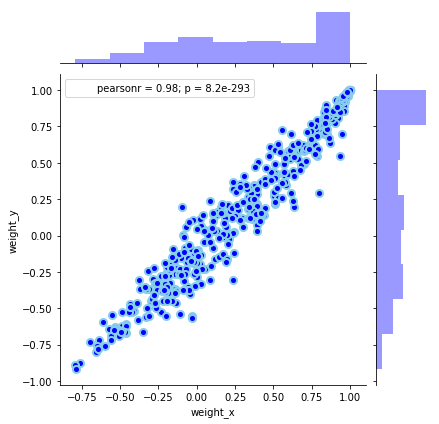

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


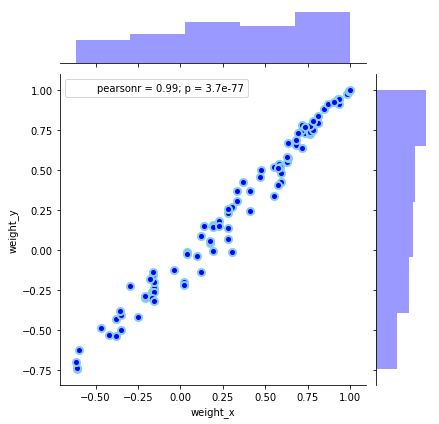

In [5]:
correlation_industry_pairs(sub_matrix_2014_2018_conn_less1[sub_matrix_2014_2018_conn_less1['Counts']<11],sub_matrix_2014_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2014_2018_conn_less1[sub_matrix_2014_2018_conn_less1['Counts']>100],sub_matrix_2014_2018_less1,'weight')


In [6]:
Gm_simple_2014_2018_flows = build_network_object(reduced_matrix_2014_2018_flows,'weight')
Gm_simple_2014_2018_conn = build_network_object(reduced_matrix_2014_2018_conn,'weight')

## Degree comparison:

NETWORK OF flows


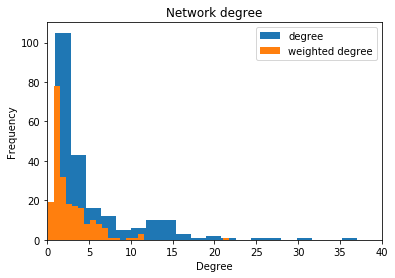

mean degree 5.390909090909091
mean strenght 2.7114018585506816


NETWORK OF connections


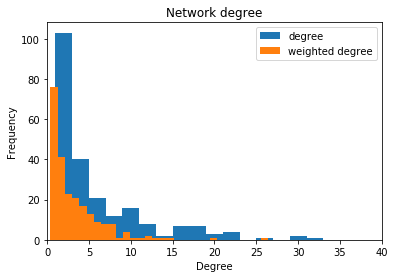

mean degree 6.104347826086957
mean strenght 3.3250012990964497


In [7]:
print ('NETWORK OF flows')
compare_degrees_strength(Gm_simple_2014_2018_flows)
print()
print()
print ('NETWORK OF connections')
compare_degrees_strength(Gm_simple_2014_2018_conn)

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


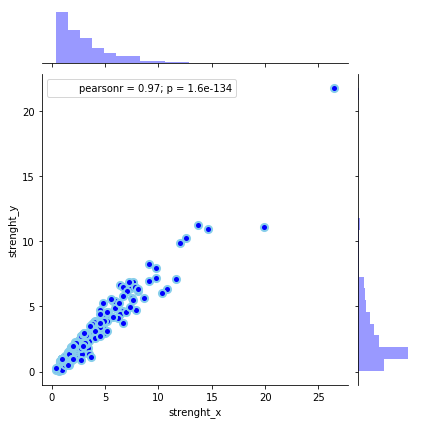

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


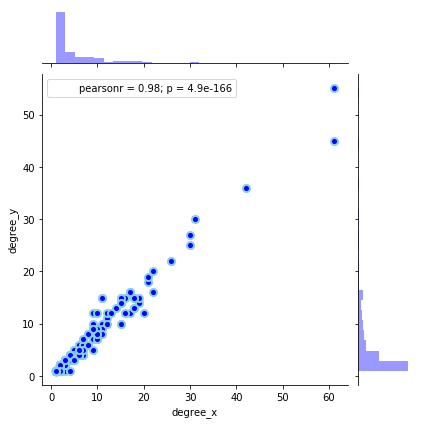

In [8]:
correlation_network_degree(Gm_simple_2014_2018_conn,Gm_simple_2014_2018_flows,'strength')
correlation_network_degree(Gm_simple_2014_2018_conn,Gm_simple_2014_2018_flows,'degree')


## Adjacency matrix:
### Flows:

In [9]:
draw_adjacency_matrix(reduced_matrix_2014_2018_flows,['StartIndst','FinalIndst'],'weight')

### Connections:

In [10]:
draw_adjacency_matrix(reduced_matrix_2014_2018_conn,['StartIndst','FinalIndst'],'weight')

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


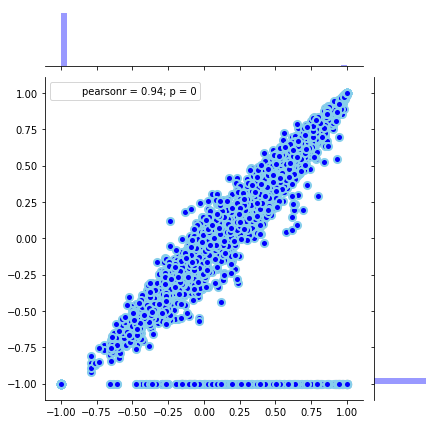

(0.9371565429484412, 0.0)


In [11]:
correlation_adjacency_matrix(reduced_matrix_2014_2018_conn,reduced_matrix_2014_2018_flows,'weight')

# Network visualisation: by main industry

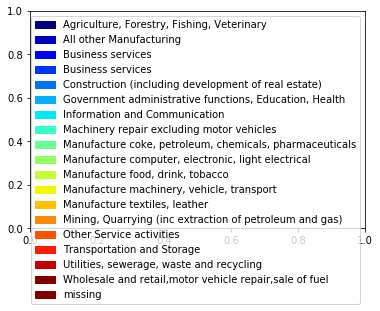

0

In [12]:
draw_network_by_classification(Gm_simple_2014_2018_flows,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2013_flows/network_industry.png)


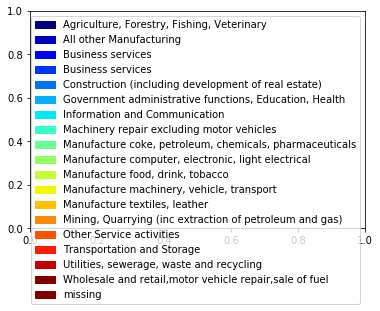

0

In [13]:
draw_network_by_classification(Gm_simple_2014_2018_conn,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_industry.png)


## Network visualisation: by community
## Flows:

In [14]:
network_components_2014_2018_flows = Gm_simple_2014_2018_flows.components()
network_largest_2014_2018_flows = network_components_2014_2018_flows.subgraphs()[0]


In [15]:
net_community_2014_2018_flows = network_largest_2014_2018_flows.community_multilevel(weights=network_largest_2014_2018_flows.es['weight'])
print ('Modularity',net_community_2014_2018_flows.modularity)

Modularity 0.6523232852507371


In [16]:
draw_and_print_communities(network_largest_2014_2018_flows,net_community_2014_2018_flows,'../img/'+label1+'/network_community.png')

Community : 1
['Temporary employment agencies', 'Other non-specialised', 'Other', 'Bread, cakes, confectionery', 'Non-specialised wholesale trade', 'Bread; pastry goods, cakes', 'Defence activities', 'Non-hazardous waste collection', 'Accounting, auditing; tax consltcy', 'Road freight transport', 'Warehousing and storage', 'Other', 'Pharmaceutical preparations', 'Pharmaceutical goods', 'Employment placement agencies', 'Other support activities', 'Other', 'Other', 'Poultry meat processing, preserving', 'Other plastic', 'Prepared meals and dishes', 'Motor vehicle other parts', 'Other', 'Plastic plates, sheets, tubes etc', 'Fruit and vegetables', 'Meat, poultry meat production', 'Chemical products', 'Packaging activities', 'Electric lighting equipment', 'Other fruit, vegetable', 'Other food products nec', 'Fish processing, preserving', 'Meat processing, preserving', 'Other natural sciences, engineering', 'Beverages', 'Social sciences, humanities', 'Grain mill products', 'Rusks, biscuits; 

## Connections:



In [17]:
network_components_2014_2018_conn = Gm_simple_2014_2018_conn.components()
network_largest_2014_2018_conn = network_components_2014_2018_conn.subgraphs()[0]
net_community_2014_2018_conn = network_largest_2014_2018_conn.community_multilevel(weights=network_largest_2014_2018_conn.es['weight'])
print ('Modularity',net_community_2014_2018_conn.modularity)

Modularity 0.6093126267719118


In [18]:
draw_and_print_communities(network_largest_2014_2018_conn,net_community_2014_2018_conn,'../img/'+label2+'/network_community.png')

Community : 1
['Tertiary', 'General public administration', 'Primary', 'General secondary', 'Technical, vocational secondary', 'Other education nec', 'Religious organisations', 'Post-secondary non-tertiary', 'Educational support activities', 'Library and archive activities', 'Other natural sciences, engineering', 'Pharmaceutical preparations', 'Pharmaceutical goods', 'Fire service activities', 'Compulsory social security activities', 'Defence activities', 'missing', 'Museum activities', 'Social sciences, humanities']

Community : 2
['Dispensing chemist', 'Dental practices', 'Other nec', 'Other amusement, recreation', 'Restaurants, mobile food service', 'Food, beverages, tobacco mainly', 'Clothing', 'Beverage serving', 'Other non specialised', 'Gambling, betting activities', 'Under universal service obligation', 'Hardware, paints, glass', 'Hairdressing, beauty treatment', 'Other new goods', 'Furniture, lighting, other', 'Water collection, treatment, supply', 'Watches, jewellery', 'Via m

### Flows:

!['something here'](../img/Table3_Reduced_matrix_2014_2018_flows/network_community.png)


### Connections:


![title](../img/Table4_Reduced_matrix_2014_2018_connections/network_community.png)
